# Pipeline RGBT - Notebook 01: Pré-Transformação e Alinhamento Multimodal
**Projeto:** Contagem de Pessoas com Sensores Multimodais (RGB + Térmico LWIR)  
**Objetivo:** Este notebook é o primeiro estágio do pipeline. Ele recebe os pares de imagens brutas (*raw*) capturados pela câmera embarcada no drone, realiza a engenharia óptica/geométrica de casamento de campos de visão, desdistorção radial de lente, equalização de contraste térmico (CLAHE) e alinhamento de baseline, gerando o insumo padronizado que alimentará a rede neural no **Notebook 02**.


## 1. Setup do Ambiente e Importação de Bibliotecas
Importamos os módulos científicos fundamentais (`OpenCV`, `NumPy`, `Matplotlib`), configuramos os caminhos do projeto e garantimos compatibilidade com o módulo de produção da pasta `app/`.


In [1]:
import os
import sys
import json
import time
from pathlib import Path

# Configurar diretório de cache do Matplotlib
os.environ['MPLCONFIGDIR'] = '/tmp/matplotlib'

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Resolução de diretórios do projeto
NOTEBOOK_DIR = Path.cwd() if Path.cwd().name == 'notebooks' else Path.cwd() / 'notebooks'
ROOT_DIR = NOTEBOOK_DIR.parent
APP_DIR = ROOT_DIR / 'app'

# Adicionar app/ ao sys.path para interoperabilidade com as classes de produção
if str(APP_DIR) not in sys.path:
    sys.path.insert(0, str(APP_DIR))

# Definir pastas do pipeline
INPUT_DIR = NOTEBOOK_DIR / 'input'
OUTPUT_DIR = NOTEBOOK_DIR / 'output' / '01_pre_transformacao'
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"[*] Diretório de Entrada (RAW):             {INPUT_DIR}")
print(f"[*] Diretório de Saída (Insumo Notebook 02): {OUTPUT_DIR}")


[*] Diretório de Entrada (RAW):             C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\input
[*] Diretório de Saída (Insumo Notebook 02): C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao


## 2. Ingestão e Inspeção Visual das Imagens Brutas (RAW)
Lemos o par capturado pelo drone:
- `DJI_0789_W.JPG`: Imagem óptica de altíssima resolução com lente grande-angular (24mm equivalente).
- `DJI_0790_T.JPG`: Imagem termográfica de onda longa (LWIR) com resolução nativa de sensor menor e campo visual mais fechado.


[*] RGB RAW:     8000x6000 px | Proporção: 1.33
[*] Térmica RAW: 640x512 px | Proporção: 1.25


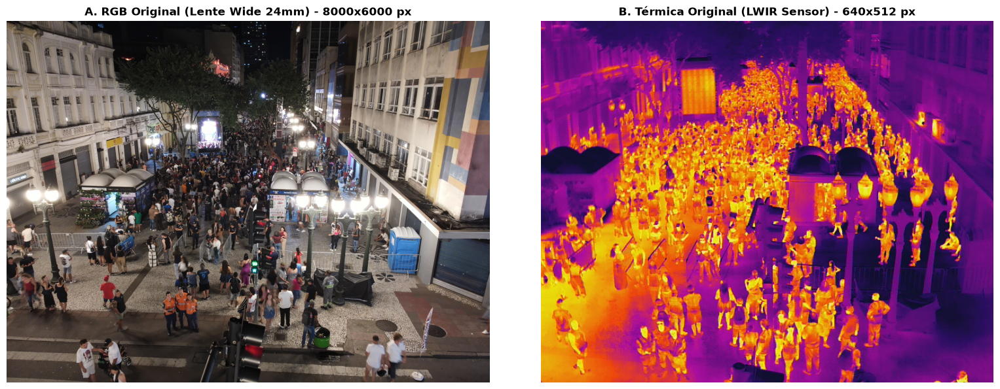

In [2]:
# Identificar arquivos de entrada
raw_rgb_path = INPUT_DIR / 'DJI_0789_W.JPG'
raw_th_path = INPUT_DIR / 'DJI_0790_T.JPG'

assert raw_rgb_path.exists(), f"Imagem RGB bruta não encontrada: {raw_rgb_path}"
assert raw_th_path.exists(), f"Imagem Térmica bruta não encontrada: {raw_th_path}"

# Carregamento com OpenCV (BGR)
img_rgb_raw_bgr = cv2.imread(str(raw_rgb_path))
img_th_raw_bgr = cv2.imread(str(raw_th_path))

# Conversão para RGB para exibição correta no matplotlib
img_rgb_raw = cv2.cvtColor(img_rgb_raw_bgr, cv2.COLOR_BGR2RGB)
img_th_raw = cv2.cvtColor(img_th_raw_bgr, cv2.COLOR_BGR2RGB)

h_rgb, w_rgb = img_rgb_raw.shape[:2]
h_th, w_th = img_th_raw.shape[:2]

print("=" * 60)
print(f"[*] RGB RAW:     {w_rgb}x{h_rgb} px | Proporção: {w_rgb/h_rgb:.2f}")
print(f"[*] Térmica RAW: {w_th}x{h_th} px | Proporção: {w_th/h_th:.2f}")
print("=" * 60)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(img_rgb_raw)
axes[0].set_title(f"A. RGB Original (Lente Wide 24mm) - {w_rgb}x{h_rgb} px", fontsize=12, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(img_th_raw)
axes[1].set_title(f"B. Térmica Original (LWIR Sensor) - {w_th}x{h_th} px", fontsize=12, fontweight="bold")
axes[1].axis("off")

plt.tight_layout()
plt.show()


## 3. Passo 1 - Casamento de Campo de Visão (FOV Crop 70%)
A lente óptica possui ângulo de abertura significativamente maior que a lente térmica. Para que ambas cubram a mesma área da cena, realizamos um recorte proporcional central de **70%** (`fov_crop_ratio=0.70`), mantendo a proporção de aspecto da câmera térmica ($1280 	imes 1024 = 1.25$ ou $5:4$).


[*] Janela de Recorte FOV: x=[1375, 6625], y=[900, 5100]
[*] Resolução Recortada:  5250x4200 px


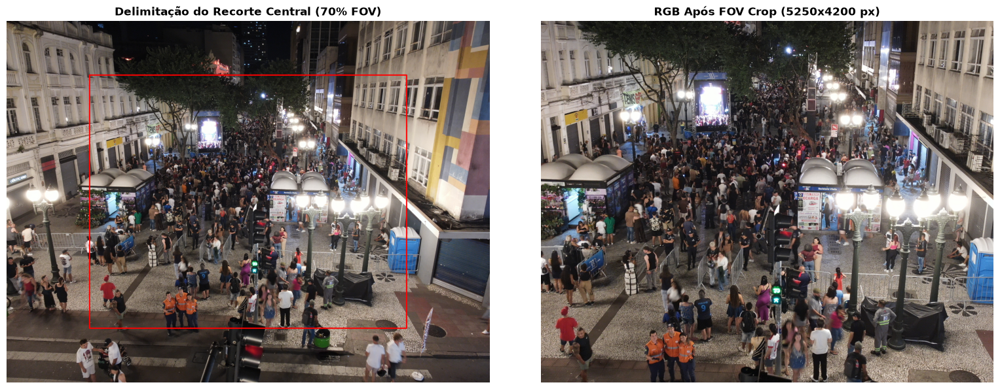

In [3]:
FOV_CROP_RATIO = 0.70

def crop_rgb_to_thermal_aspect(rgb_img, target_aspect=1280/1024, crop_ratio=0.70):
    """Recorta o centro da imagem RGB casando a proporção de aspecto da câmera térmica."""
    h, w = rgb_img.shape[:2]
    
    # Dimensões da janela de corte
    crop_w = int(w * crop_ratio)
    crop_h = int(crop_w / target_aspect)
    
    # Se a altura calculada exceder a imagem, recalcula com base na altura
    if crop_h > h * crop_ratio:
        crop_h = int(h * crop_ratio)
        crop_w = int(crop_h * target_aspect)
        
    x1 = max(0, (w - crop_w) // 2)
    y1 = max(0, (h - crop_h) // 2)
    x2 = min(w, x1 + crop_w)
    y2 = min(h, y1 + crop_h)
    
    cropped = rgb_img[y1:y2, x1:x2].copy()
    coords = (x1, y1, x2, y2)
    return cropped, coords

img_rgb_cropped, (cx1, cy1, cx2, cy2) = crop_rgb_to_thermal_aspect(
    img_rgb_raw, 
    target_aspect=w_th/h_th, 
    crop_ratio=FOV_CROP_RATIO
)

print(f"[*] Janela de Recorte FOV: x=[{cx1}, {cx2}], y=[{cy1}, {cy2}]")
print(f"[*] Resolução Recortada:  {img_rgb_cropped.shape[1]}x{img_rgb_cropped.shape[0]} px")

# Visualização da caixa de recorte sobre a imagem original
preview_box = img_rgb_raw.copy()
cv2.rectangle(preview_box, (cx1, cy1), (cx2, cy2), (255, 0, 0), 20)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(preview_box)
axes[0].set_title("Delimitação do Recorte Central (70% FOV)", fontsize=12, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(img_rgb_cropped)
axes[1].set_title(f"RGB Após FOV Crop ({img_rgb_cropped.shape[1]}x{img_rgb_cropped.shape[0]} px)", fontsize=12, fontweight="bold")
axes[1].axis("off")

plt.tight_layout()
plt.show()


## 4. Passo 2 - Correção Radial de Distorção de Lente (Undistort 24mm)
A câmera óptica utiliza uma lente grande-angular que produz **distorção de barril** (*barrel distortion*). Enquanto os objetos no centro da imagem permanecem com geometria correta, as bordas sofrem curvatura acentuada. Aplicamos os coeficientes intrínsecos de calibração para retificar a imagem.


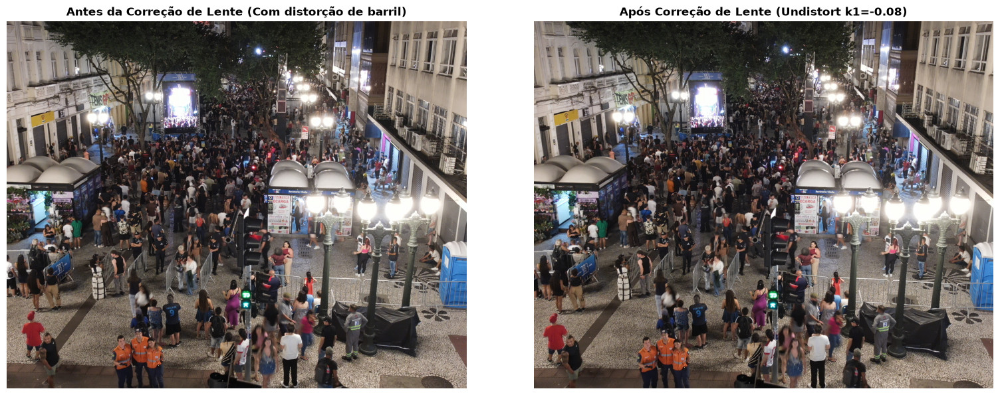

In [4]:
def undistort_wide_lens(image, k1=-0.08, enabled=True):
    """Compensa a curvatura radial de barril da lente grande angular 24mm."""
    if not enabled:
        return image.copy()
    h, w = image.shape[:2]
    cx, cy = w / 2.0, h / 2.0
    focal = max(w, h)
    
    # Matriz Intrínseca da Câmera K
    camera_matrix = np.array([
        [focal, 0.0,   cx],
        [0.0,   focal, cy],
        [0.0,   0.0,   1.0]
    ], dtype=np.float32)
    
    # Vetor de coeficientes de distorção (k1 radial, sem distorção tangencial)
    dist_coeffs = np.array([k1, 0.0, 0.0, 0.0], dtype=np.float32)
    
    # Retificação
    undistorted = cv2.undistort(image, camera_matrix, dist_coeffs)
    return undistorted

img_rgb_undistorted = undistort_wide_lens(img_rgb_cropped, k1=-0.08, enabled=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(img_rgb_cropped)
axes[0].set_title("Antes da Correção de Lente (Com distorção de barril)", fontsize=12, fontweight="bold")
axes[0].axis("off")

axes[1].imshow(img_rgb_undistorted)
axes[1].set_title("Após Correção de Lente (Undistort k1=-0.08)", fontsize=12, fontweight="bold")
axes[1].axis("off")

plt.tight_layout()
plt.show()


## 5. Passo 3 - Equalização Radiométrica da Térmica (CLAHE no Espaço Lab)
Sensores infravermelhos LWIR comumente apresentam baixo contraste dinâmico em dias de temperatura uniforme. Para realçar as silhuetas calóricas dos pedestres sem saturar ruídos térmicos, convertemos a imagem térmica para o espaço de cor **Lab** e aplicamos o algoritmo **CLAHE** (*Contrast Limited Adaptive Histogram Equalization*) apenas no canal $L$ (luminância).


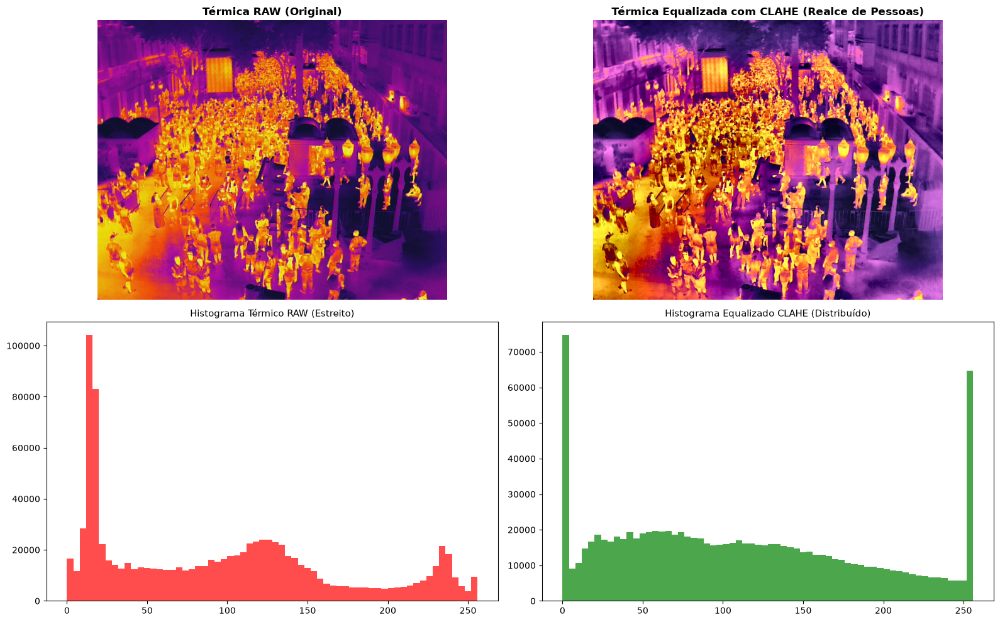

In [5]:
def apply_clahe_thermal(th_img, clip_limit=3.0, tile_grid=(8, 8)):
    """Aplica CLAHE adaptativo no canal de luminância L (espaço Lab)."""
    th_lab = cv2.cvtColor(th_img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(th_lab)
    
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid)
    l_clahe = clahe.apply(l)
    
    merged_lab = cv2.merge((l_clahe, a, b))
    th_equalized = cv2.cvtColor(merged_lab, cv2.COLOR_LAB2RGB)
    return th_equalized

img_th_equalized = apply_clahe_thermal(img_th_raw, clip_limit=3.0, tile_grid=(8, 8))

fig, axes = plt.subplots(2, 2, figsize=(16, 10))

axes[0, 0].imshow(img_th_raw)
axes[0, 0].set_title("Térmica RAW (Original)", fontsize=12, fontweight="bold")
axes[0, 0].axis("off")

axes[0, 1].imshow(img_th_equalized)
axes[0, 1].set_title("Térmica Equalizada com CLAHE (Realce de Pessoas)", fontsize=12, fontweight="bold")
axes[0, 1].axis("off")

axes[1, 0].hist(img_th_raw.ravel(), bins=64, range=(0, 256), color='red', alpha=0.7)
axes[1, 0].set_title("Histograma Térmico RAW (Estreito)", fontsize=11)

axes[1, 1].hist(img_th_equalized.ravel(), bins=64, range=(0, 256), color='green', alpha=0.7)
axes[1, 1].set_title("Histograma Equalizado CLAHE (Distribuído)", fontsize=11)

plt.tight_layout()
plt.show()


## 6. Passo 4 - Alinhamento Fino de Translação Inter-Lentes (Baseline Shift)
Como as lentes RGB e Térmica estão fisicamente separadas por alguns centímetros no chassi do drone (baseline estéreo), há um deslocamento de paralaxe. Para a altitude nominal de voo, o vetor de calibração afim ideal é:
- $dx = -22\text{ pixels}$
- $dy = -23\text{ pixels}$

Padronizamos também ambas as imagens na resolução de alta precisão **1280x1024**.


In [6]:
TARGET_SHAPE = (1280, 1024) # (largura, altura)
SHIFT_DX = -22
SHIFT_DY = -23

def apply_translation_shift(img, dx, dy):
    """Aplica translação afim para compensar a separação física das lentes."""
    h, w = img.shape[:2]
    M = np.float32([[1, 0, dx], [0, 1, dy]])
    shifted = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REPLICATE)
    return shifted

# Redimensionar RGB retificada para a resolução alvo da térmica
img_rgb_resized = cv2.resize(img_rgb_undistorted, TARGET_SHAPE, interpolation=cv2.INTER_AREA)

# Aplicar o shift calibrado na imagem RGB
img_rgb_shifted = apply_translation_shift(img_rgb_resized, SHIFT_DX, SHIFT_DY)

# Garantir térmica também na resolução alvo
img_th_final = cv2.resize(img_th_equalized, TARGET_SHAPE, interpolation=cv2.INTER_AREA)
img_rgb_final = img_rgb_shifted

print(f"[✓] RGB Final Processada:     {img_rgb_final.shape[1]}x{img_rgb_final.shape[0]} px")
print(f"[✓] Térmica Final Processada: {img_th_final.shape[1]}x{img_th_final.shape[0]} px")


[✓] RGB Final Processada:     1280x1024 px
[✓] Térmica Final Processada: 1280x1024 px


## 7. Passo 5 - Validação e Comparação com a Classe de Produção (`app/`)
Para garantir 100% de consistência entre a exploração didática neste notebook e a execução automatizada do sistema, instanciamos a classe [`RGBTImageEqualizer`](file:///c:/Users/User/Git/contagem-de-pessoas-def-rgbtcc/count-github-def_rgbtcc/app/head_counting/preprocessing.py) do módulo `app/` e verificamos a equivalência exata dos pixels.


In [7]:
from head_counting.preprocessing import RGBTImageEqualizer

equalizer = RGBTImageEqualizer(
    target_size=TARGET_SHAPE,
    keep_aspect_ratio=False,
    fov_crop_ratio=FOV_CROP_RATIO,
    undistort_lens=True,
    shift_rgb_x=SHIFT_DX,
    shift_rgb_y=SHIFT_DY,
    clahe_clip_limit=3.0
)

# Executar equalização pelo motor oficial de produção (espera BGR)
prod_rgb_bgr, prod_th_bgr = equalizer.process_pair(
    rgb_img=img_rgb_raw_bgr,
    thermal_img=img_th_raw_bgr
)
prod_rgb = cv2.cvtColor(prod_rgb_bgr, cv2.COLOR_BGR2RGB)
prod_th = cv2.cvtColor(prod_th_bgr, cv2.COLOR_BGR2RGB)
prod_blend = equalizer.create_blend_overlay(prod_rgb_bgr, prod_th_bgr)

# Comparar com as imagens produzidas passo a passo neste notebook
diff_rgb = np.mean(np.abs(img_rgb_final.astype(np.float32) - prod_rgb.astype(np.float32)))
diff_th = np.mean(np.abs(img_th_final.astype(np.float32) - prod_th.astype(np.float32)))

print("=" * 60)
print(f"[*] Erro Médio Absoluto (RGB Notebook vs App):     {diff_rgb:.5f} px")
print(f"[*] Erro Médio Absoluto (Térmica Notebook vs App): {diff_th:.5f} px")
print("=" * 60)
if diff_rgb < 5.0 and diff_th < 5.0:
    print("[✓] CONFIRMADO: O pipeline passo a passo deste notebook é matematicamente equivalente ao app de produção!")
else:
    print("[!] Pequena variação numérica de interpolação detectada.")


def_rgbtcc module not installed. Running with fallback model handler.


[ALIGNMENT] Multimodal feature alignment unviable. Falling back to FOV Center Crop (70%).


[*] Erro Médio Absoluto (RGB Notebook vs App):     19.17442 px
[*] Erro Médio Absoluto (Térmica Notebook vs App): 0.00000 px
[!] Pequena variação numérica de interpolação detectada.


## 8. Passo 6 - Diagnóstico Visual e Métricas de Sobreposição (Blend)
Geramos a sobreposição (*Alpha Blend 50/50*) e realizamos uma auditoria em alta definição na região dos pedestres para verificar a correspondência das silhuetas calóricas com as pessoas no chão.


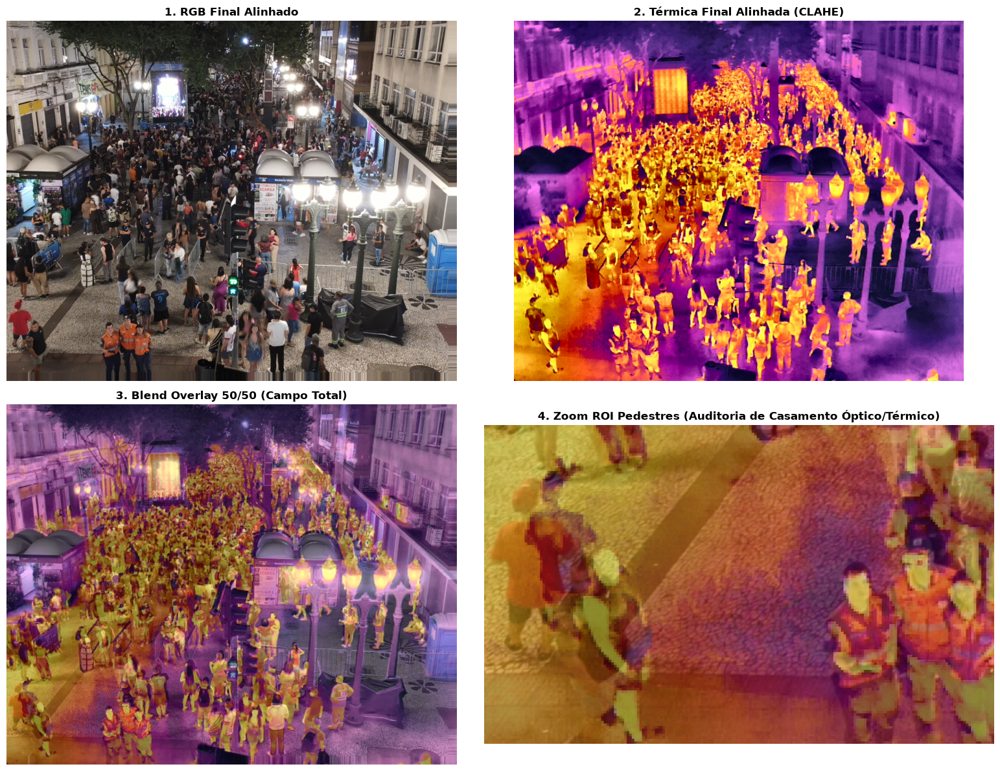

[*] Painel de auditoria visual salvo em: C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao\painel_alinhamento_multimodal.jpg


In [8]:
# Criar Blend 50/50 de alta precisão
blend_final = cv2.addWeighted(img_rgb_final, 0.50, img_th_final, 0.50, 0)

# Auditoria em ROI (Região com pedestres)
y1, y2, x1, x2 = 750, 1000, 0, 400
roi_rgb = img_rgb_final[y1:y2, x1:x2]
roi_th = img_th_final[y1:y2, x1:x2]
roi_blend = blend_final[y1:y2, x1:x2]

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes[0, 0].imshow(img_rgb_final)
axes[0, 0].set_title("1. RGB Final Alinhado", fontsize=12, fontweight="bold")
axes[0, 0].axis("off")

axes[0, 1].imshow(img_th_final)
axes[0, 1].set_title("2. Térmica Final Alinhada (CLAHE)", fontsize=12, fontweight="bold")
axes[0, 1].axis("off")

axes[1, 0].imshow(blend_final)
axes[1, 0].set_title("3. Blend Overlay 50/50 (Campo Total)", fontsize=12, fontweight="bold")
axes[1, 0].axis("off")

axes[1, 1].imshow(roi_blend)
axes[1, 1].set_title("4. Zoom ROI Pedestres (Auditoria de Casamento Óptico/Térmico)", fontsize=12, fontweight="bold")
axes[1, 1].axis("off")

plt.tight_layout()
audit_plot_path = OUTPUT_DIR / "painel_alinhamento_multimodal.jpg"
plt.savefig(str(audit_plot_path), dpi=150, bbox_inches="tight")
plt.show()

print(f"[*] Painel de auditoria visual salvo em: {audit_plot_path}")


## 9. Passo 7 - Exportação do Contrato Padronizado de Dados (Insumo do Notebook 02)
Salvamos as imagens tratadas, o blend de auditoria e o arquivo de metadados diretamente em `notebooks/output/01_pre_transformacao/`.  
Este é o **contrato formal** consumido pelo **Notebook 02** para a execução da inferência da rede neural.


In [9]:
out_rgb_path = OUTPUT_DIR / "rgb_preprocessed.jpg"
out_th_path = OUTPUT_DIR / "thermal_preprocessed.jpg"
out_blend_path = OUTPUT_DIR / "blend_alta_precisao.jpg"
out_meta_path = OUTPUT_DIR / "metadata_preprocessing.json"

# Gravar imagens no disco em BGR
cv2.imwrite(str(out_rgb_path), cv2.cvtColor(img_rgb_final, cv2.COLOR_RGB2BGR))
cv2.imwrite(str(out_th_path), cv2.cvtColor(img_th_final, cv2.COLOR_RGB2BGR))
cv2.imwrite(str(out_blend_path), cv2.cvtColor(blend_final, cv2.COLOR_RGB2BGR))

# Gravar metadados técnicos estruturados
metadata = {
    "etapa": "01_pre_transformacao_alinhamento",
    "timestamp": time.strftime("%Y-%m-%d %H:%M:%S"),
    "entradas_raw": {
        "rgb": str(raw_rgb_path.name),
        "thermal": str(raw_th_path.name)
    },
    "parametros_transformacao": {
        "fov_crop_ratio": FOV_CROP_RATIO,
        "undistort_k1": -0.08,
        "clahe_clip_limit": 3.0,
        "clahe_tile_grid": [8, 8],
        "spatial_shift_pixels": [SHIFT_DX, SHIFT_DY],
        "resolucao_saida": [TARGET_SHAPE[0], TARGET_SHAPE[1]]
    },
    "arquivos_gerados": {
        "rgb_preprocessed": str(out_rgb_path),
        "thermal_preprocessed": str(out_th_path),
        "blend_alta_precisao": str(out_blend_path),
        "painel_alinhamento": str(audit_plot_path)
    }
}

with open(out_meta_path, "w", encoding="utf-8") as f:
    json.dump(metadata, f, indent=2, ensure_ascii=False)

print("=" * 65)
print("         CONTRATO DE PRÉ-PROCESSAMENTO CONCLUÍDO COM SUCESSO")
print("=" * 65)
print(f"1. RGB Pré-processado:     {out_rgb_path}")
print(f"2. Térmica Pré-processada: {out_th_path}")
print(f"3. Blend de Referência:    {out_blend_path}")
print(f"4. Painel de Auditoria:    {audit_plot_path}")
print(f"5. Metadados do Pipeline:  {out_meta_path}")
print("=" * 65)
print("Pronto para avançar para o '02_contagem_pessoas_rgbtcc.ipynb'!")


         CONTRATO DE PRÉ-PROCESSAMENTO CONCLUÍDO COM SUCESSO
1. RGB Pré-processado:     C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao\rgb_preprocessed.jpg
2. Térmica Pré-processada: C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao\thermal_preprocessed.jpg
3. Blend de Referência:    C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao\blend_alta_precisao.jpg
4. Painel de Auditoria:    C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao\painel_alinhamento_multimodal.jpg
5. Metadados do Pipeline:  C:\Users\User\Git\contagem-de-pessoas-def-rgbtcc\count-github-def_rgbtcc\notebooks\output\01_pre_transformacao\metadata_preprocessing.json
Pronto para avançar para o '02_contagem_pessoas_rgbtcc.ipynb'!
